<a href="https://colab.research.google.com/github/taegukang35/ML-study/blob/main/Depth_estimation_pf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Make **video**

In [ ]:
!pip install tensorflow tensorflow-hub opencv-python matplotlib

In [4]:
import cv2
import glob
import os
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_hub as hub


gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    #tf.config.experimental.set_memory_growth(gpu, True)
    tf.config.experimental.set_virtual_device_configuration(gpu,
    [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4000)])
# load model
module = hub.load("https://tfhub.dev/intel/midas/v2_1_small/1", tags=['serve'])

def predict_depth(IMG_PATH):
    # input
    #img = cv2.imread('/content/KakaoTalk_20210901_233802339.jpg')
    img = cv2.imread(IMG_PATH)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) / 255.0

    img_resized = tf.image.resize(img, [256,256], method='bicubic', preserve_aspect_ratio=False)
    img_resized = tf.transpose(img_resized, [2, 0, 1])
    img_input = img_resized.numpy()
    reshape_img = img_input.reshape(1,3,256,256)
    tensor = tf.convert_to_tensor(reshape_img, dtype=tf.float32)

    output = module.signatures['serving_default'](tensor)
    prediction = output['default'].numpy()
    prediction = prediction.reshape(256, 256)
                
    # output file
    prediction = cv2.resize(prediction, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_CUBIC)
    #print(" Write image to: output.png")
    depth_min = prediction.min()
    depth_max = prediction.max()
    img_out = (255 * (prediction - depth_min) / (depth_max - depth_min)).astype("uint8")
    
    #cv2.imwrite("output.png", img_out)
    #plt.imshow(img_out,cmap='magma')
    return prediction,img_out
    # plt.show()

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [27]:
import json
import cv2
import numpy as np
import urllib.request


base_dir = '/content'
images_dir = os.path.join(base_dir,'images')
os.mkdir(images_dir)


def url_to_image(url):
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype='uint8')
  image = cv2.imdecode(image, cv2.IMREAD_COLOR)
  return image

#https://segments.ai/prgmti1/school_hallway_v2/releases 에서 받은 v.01 json 파일 
with open('/content/school_hallway_ver2-v0.1','r') as f:
  dataset = json.load(f) 

for i in range(400):
    img_url = dataset['dataset']['samples'][i]['attributes']['image']['url']
    img_name = dataset['dataset']['samples'][i]['name']
    img = url_to_image(img_url)
    cv2.imwrite(os.path.join(images_dir,img_name),img)

/content/images/0.jpg
/content/images/1.jpg
/content/images/2.jpg
/content/images/3.jpg
/content/images/4.jpg
/content/images/5.jpg
/content/images/6.jpg
/content/images/7.jpg
/content/images/8.jpg
/content/images/9.jpg
/content/images/10.jpg
/content/images/11.jpg
/content/images/12.jpg
/content/images/13.jpg
/content/images/14.jpg
/content/images/15.jpg
/content/images/16.jpg
/content/images/17.jpg
/content/images/18.jpg
/content/images/19.jpg
/content/images/20.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


/content/images/21.jpg
/content/images/22.jpg
/content/images/23.jpg
/content/images/24.jpg
/content/images/25.jpg
/content/images/26.jpg
/content/images/27.jpg
/content/images/28.jpg
/content/images/29.jpg
/content/images/30.jpg
/content/images/31.jpg
/content/images/32.jpg
/content/images/33.jpg
/content/images/34.jpg
/content/images/35.jpg
/content/images/36.jpg
/content/images/37.jpg
/content/images/38.jpg
/content/images/39.jpg
/content/images/40.jpg
/content/images/41.jpg
/content/images/42.jpg
/content/images/43.jpg
/content/images/44.jpg
/content/images/45.jpg
/content/images/46.jpg
/content/images/47.jpg
/content/images/48.jpg
/content/images/49.jpg
/content/images/50.jpg
/content/images/51.jpg
/content/images/52.jpg
/content/images/53.jpg
/content/images/54.jpg
/content/images/55.jpg
/content/images/56.jpg
/content/images/57.jpg
/content/images/58.jpg
/content/images/59.jpg
/content/images/60.jpg
/content/images/61.jpg
/content/images/62.jpg
/content/images/63.jpg
/content/im

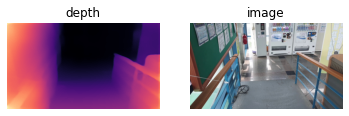

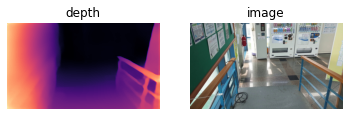

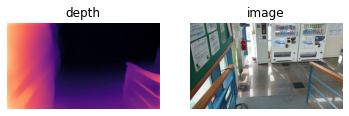

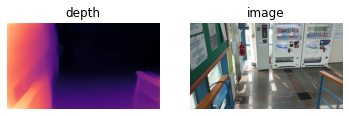

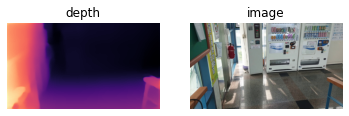

...

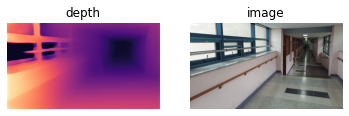

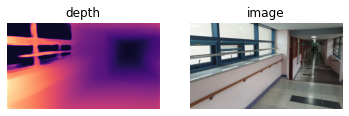

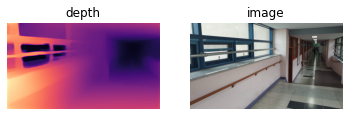

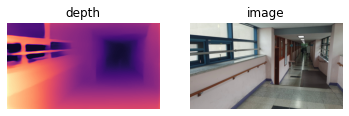

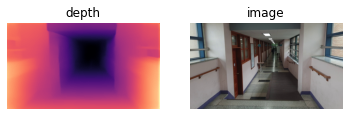

In [38]:
SAVE_PATH = os.path.join(base_dir,'results')
os.mkdir(SAVE_PATH)

for i in range(400):
    img_path = os.path.join(images_dir,'{0}.jpg'.format(i))
    print(img_path)
    if os.path.isfile(img_path):
        depth_map,depth_img = predict_depth(img_path)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # plot result
        fig = plt.figure()     
        rows = 1
        cols = 2
        ax1 = fig.add_subplot(rows, cols, 1)
        ax1.imshow(depth_img,cmap='magma')
        ax1.set_title('depth')
        ax1.axis("off")
        ax2 = fig.add_subplot(rows, cols, 2)
        ax2.imshow(img)
        ax2.set_title('image')
        ax2.axis("off")
        plt.savefig(os.path.join(SAVE_PATH,'{0}.png'.format(i)))

video = []
for i in range(400):
    img_path = os.path.join(SAVE_PATH,'{0}.png'.format(i))
    if os.path.isfile(img_path):
        img = cv2.imread(img_path)
        video.append(img)

h,w,l = img_array[0].shape
size = (w,h)
out = cv2.VideoWriter('depth_video.avi',cv2.VideoWriter_fourcc(*'DIVX'),10, size)
 
for i in range(len(video)):
    out.write(video[i])
out.release()